# **Assignment 1 - London Crime Dataset Visualization**

Name: Sarah Aristawidya

Class: PYTN-KS19

# Project Overview

The aim of this projects is to introduce you to data visualization with Python as concrete and as consistent as possible. Using what you’ve learned; download the London Crime Dataset from Kaggle. This dataset is a record of crime in major metropolitan areas, such as London, occurs in distinct patterns. This data covers the number of criminal reports by month, LSOA borough, and major/minor category from Jan 2008-Dec 2016.

This dataset contains:

- lsoa_code: this represents a policing area
- borough: the london borough for which the statistic is related
- major_category: the major crime category
- minor_category: the minor crime category
- value: the count of the crime for that particular borough, in that particular month
- year: the year of the summary statistic
- month: the month of the summary statistic

Formulate a question and derive a statistical hypothesis test to answer the question. You have to demonstrate that you’re able to make decisions using data in a scientific manner. And the important things, Visualized the data. Examples of questions can be:

 - What is the change in the number of crime incidents from 2011 to 2016?
 - What were the top 3 crimes per borough in 2016?
 
**Link Dataset:** https://www.kaggle.com/datasets/jboysen/london-crime

# Import the Library Required

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import plotly.express as px
import statsmodels.api as sm
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins
from geopy.geocoders import Nominatim
from urllib.request import urlopen
import json
import plotly.graph_objects as go

# **Data**

Load Data: Reading a CSV file containing crimes data in London into a DataFrame using the pandas library.
<hr>

In [2]:
data = pd.read_csv("london_crime_by_lsoa.csv")

# Show top 5 data 
data.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


Creating a copy of the original data by defining it as 'df' to ensure the original data.

In [3]:
df = data.copy()
df

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6
...,...,...,...,...,...,...,...
13490599,E01000504,Brent,Criminal Damage,Criminal Damage To Dwelling,0,2015,2
13490600,E01002504,Hillingdon,Robbery,Personal Property,1,2015,6
13490601,E01004165,Sutton,Burglary,Burglary in a Dwelling,0,2011,2
13490602,E01001134,Croydon,Robbery,Business Property,0,2011,5


In [4]:
# Show how many rows and columns in dataset
df.shape

(13490604, 7)

# Data Pre-Processing

Create a new column, named 'date', by combining the 'year' and 'month' columns and then convert it to a datetime format.

In [5]:
date = []
for i,j in zip(df["year"],df["month"]):
    date.append(f"{i} {j}")
df["date"] = date

df["date"] = pd.to_datetime(df["date"], format="%Y %m")

# Show top 5 data 
df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


The data above show that there is a column called 'lsoa_code' that contains police area codes. This data is not needed as there is already a 'borough' column that represents the information for the city names in London. Therefore, we can proceed to delete the 'lsoa_code' column.

In [6]:
# Delete 'lsoa_code'
df.drop('lsoa_code', axis=1, inplace=True)
# Show the latest 5 rows of the DataFrame
df.head()

,borough,major_category,minor_category,value,year,month,date
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


In [7]:
# Check the number of missing values in the dataset
df.isnull().sum()

borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
date              0
dtype: int64

In [8]:
# View data type information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13490604 entries, 0 to 13490603
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   borough         object        
 1   major_category  object        
 2   minor_category  object        
 3   value           int64         
 4   year            int64         
 5   month           int64         
 6   date            datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 720.5+ MB


# **Data Visualization**
<hr>

# Line Plot
A line plot is a type of data visualization that represents data as a series of points connected by straight lines. It's often used to show how a particular variable changes over time or across different categories.

**1. What is the difference between the highest and lowest crimes within the range of years 2008-2016?**

In [9]:
# Sort by "date" column in ascending order
df_date = df.sort_values("date")
df_date = df_date.set_index("date")

# total sum of "value" for each year
sum_peryear = df_date.resample("Y").sum(numeric_only=True)[["value"]]
sum_peryear

,value
date,
2008-12-31,738641
2009-12-31,717214
2010-12-31,715324
2011-12-31,724915
2012-12-31,737329
2013-12-31,686407
2014-12-31,680183
2015-12-31,711624
2016-12-31,736121


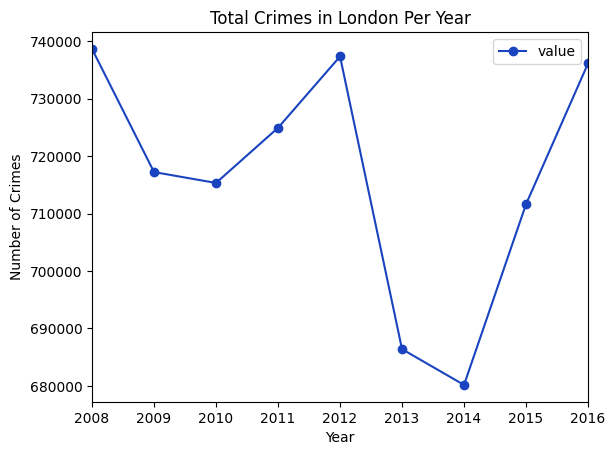

In [10]:
# Make line plot
sum_peryear.plot(kind="line", marker='o', color="#1A43BF")
plt.title("Total Crimes in London Per Year")
plt.ylabel("Number of Crimes")
plt.xlabel("Year")
plt.show()

**Conclusion**: Conclusion: The line plot depicts the total number of crimes in London per year. The x-axis represents the years, the y-axis represents the number of crimes, and the data points are connected by lines. Based on the above graph, it can be concluded that the highest number of crimes occurred in 2008, amounting to 738,641, and the lowest number of crimes occurred in 2014, amounting to 680,183. Therefore, `it can be inferred that the difference between the crimes that occurred in the highest and lowest years is 58,458`.

**Visualization Chart of the Conclusions Above:**

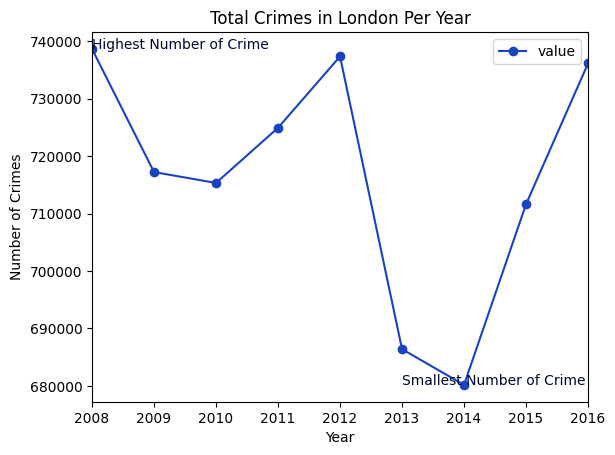

In [11]:
sum_peryear.plot(kind="line", marker='o', color="#1A43BF")
plt.title("Total Crimes in London Per Year")
plt.ylabel("Number of Crimes")
plt.xlabel("Year")

# Add point text
plt.text(38,738641,'Highest Number of Crime',color="#00072D")
plt.text(43,680183,'Smallest Number of Crime',color="#00072D")
plt.show()

**2. Which borough has the highest crime rate in London?**

In [12]:
# list of borough names sorted from the highest total reported crime values to the lowest.
crimes = df.groupby("borough").sum(numeric_only=True)[["value"]].sort_values("value",ascending=False).index
crimes

Index(['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham', 'Croydon',
       'Ealing', 'Islington', 'Tower Hamlets', 'Brent', 'Hackney', 'Lewisham',
       'Haringey', 'Barnet', 'Hillingdon', 'Wandsworth', 'Waltham Forest',
       'Enfield', 'Hounslow', 'Hammersmith and Fulham', 'Bromley', 'Redbridge',
       'Greenwich', 'Kensington and Chelsea', 'Barking and Dagenham',
       'Havering', 'Harrow', 'Merton', 'Bexley', 'Sutton',
       'Richmond upon Thames', 'Kingston upon Thames', 'City of London'],
      dtype='object', name='borough')

In [13]:
# Assuming 'date' is a datetime column and group by 'borough' and year
crimes_peryear = df[df["borough"].isin(crimes)][["borough", "value", "year"]]

# Group by 'borough' and 'year' and sum the 'value'
crime_sum_per_year_borough = crimes_peryear.groupby(["borough", "year"])["value"].sum().reset_index()

pd.reset_option("display.max_rows")

crime_sum_per_year_borough

,borough,year,value
0,Barking and Dagenham,2008,17656
1,Barking and Dagenham,2009,17713
2,Barking and Dagenham,2010,17130
3,Barking and Dagenham,2011,16686
4,Barking and Dagenham,2012,15990
...,...,...,...
292,Westminster,2012,59226
293,Westminster,2013,53852
294,Westminster,2014,47564
295,Westminster,2015,47395


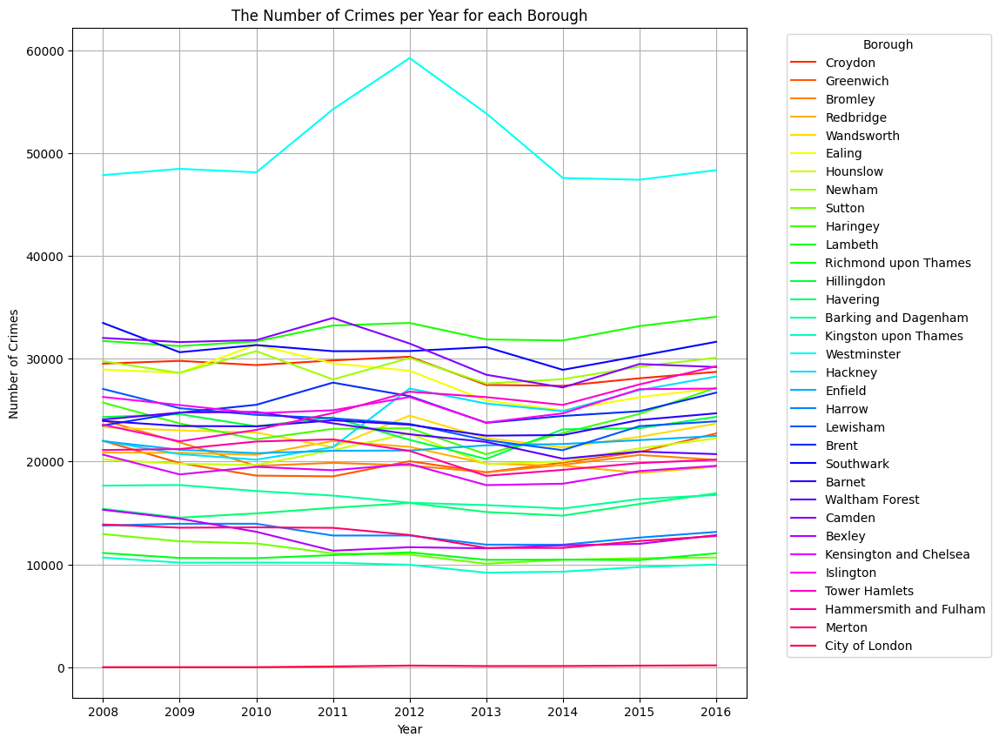

In [14]:
plt.figure(figsize=(10,10))

# Create a list of unique borough names from the "borough" column
boroughs = df["borough"].unique()

# Generate a list of unique colors using Seaborn's 
unique_colors = sns.color_palette("hsv", len(boroughs))

for i, borough in enumerate(boroughs):
    data = crime_sum_per_year_borough[crime_sum_per_year_borough["borough"] == borough]
    color = unique_colors[i]  # Use a unique color for each borough
    plt.plot(data["year"], data["value"], label=borough, color=color)

plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.title("The Number of Crimes per Year for each Borough")
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

**Conclusion**: The line plot illustrates the total number of crimes per year for each borough in London. This graph provides a visual understanding of how crime rates change from year to year in various boroughs in London. Based on the above graph, it can be concluded that `the highest number of crimes occurred in Westminster in 2012 with a total crime count of 59,226, and the lowest crime rate occurred in the City of London in 2008 with a total crime count of 0`.

# Pie Chart
A pie chart is a circular statistical graphic that is divided into slices to illustrate numerical proportion. Each slice of the pie represents a specific category or proportion, and the size of each slice is directly proportional to the quantity it represents.

**What is the most common crime in London?**

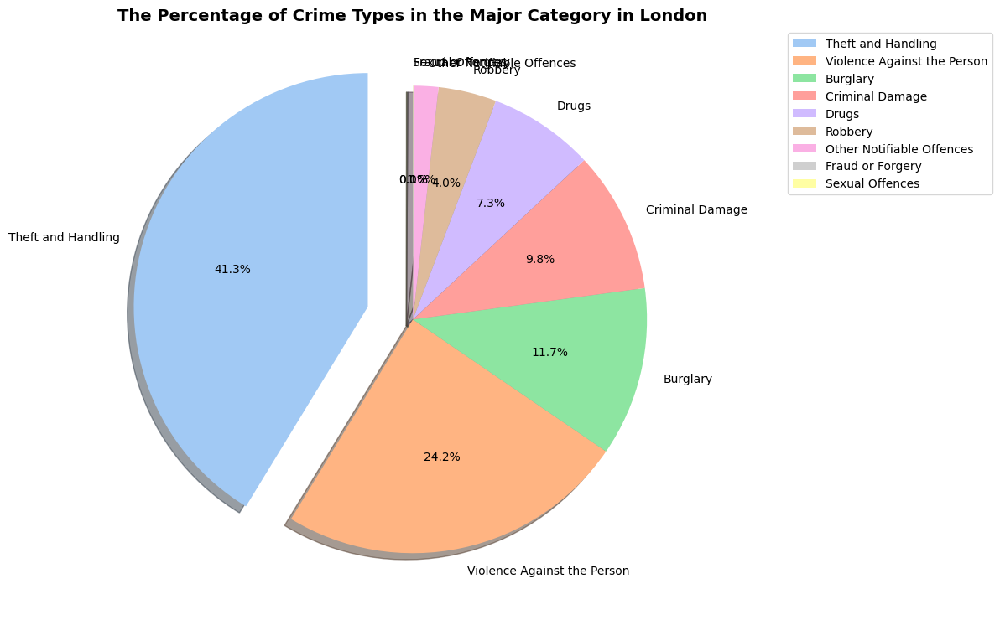

In [15]:
# Sort the total number of crimes for each major category in descending order
crime_by_major = df.groupby("major_category")
crime_count_by_major = crime_by_major["value"].sum()
crime_count_by_major = crime_count_by_major.sort_values(ascending=False)
explode_list = [0.2, 0, 0, 0, 0, 0, 0, 0, 0] 

# Create a custom pastel color palette
pastel_colors = sns.color_palette("pastel", len(crime_count_by_major))

# Make pie chart
plt.figure(figsize=(9, 20))
plt.pie(crime_count_by_major, labels=crime_count_by_major.index, autopct="%.1f%%", startangle=90, shadow=True, explode=explode_list, colors=pastel_colors)
plt.title('The Percentage of Crime Types in the Major Category in London', fontsize=14, fontweight='bold')
plt.legend(labels=crime_count_by_major.index, loc='upper right', bbox_to_anchor=(1.5, 1))

plt.show()

**Conclusion:** The pie chart illustrates the percentage of various types of crimes within major categories in London. Based on the above pie chart, it can be concluded that `the highest type of crime in London is Theft and Handling, accounting for a percentage of 41%`.

# Area Chart
Area chart is a data visualization that represents the data using filled areas under a line or curve. 

**List the top 5 areas with the highest crime rates in London!**

In [16]:
# Top 5 London boroughs with the highest total number of reported crimes
top5_borough = df.groupby("borough").sum(numeric_only=True)[["value"]].sort_values("value",ascending=False).head().index
top5_borough

Index(['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham'], dtype='object', name='borough')

In [17]:
# Show the total number of crimes per year for the top 5 boroughs with the highest crime counts
top5 = df[df["borough"].isin(top5_borough)][["borough","value","year"]]
top5 = top5.groupby(["borough","year"]).sum()[["value"]].reset_index()
top5

,borough,year,value
0,Camden,2008,32010
1,Camden,2009,31612
2,Camden,2010,31804
3,Camden,2011,33956
4,Camden,2012,31472
5,Camden,2013,28435
6,Camden,2014,27198
7,Camden,2015,29477
8,Camden,2016,29183
9,Lambeth,2008,31717


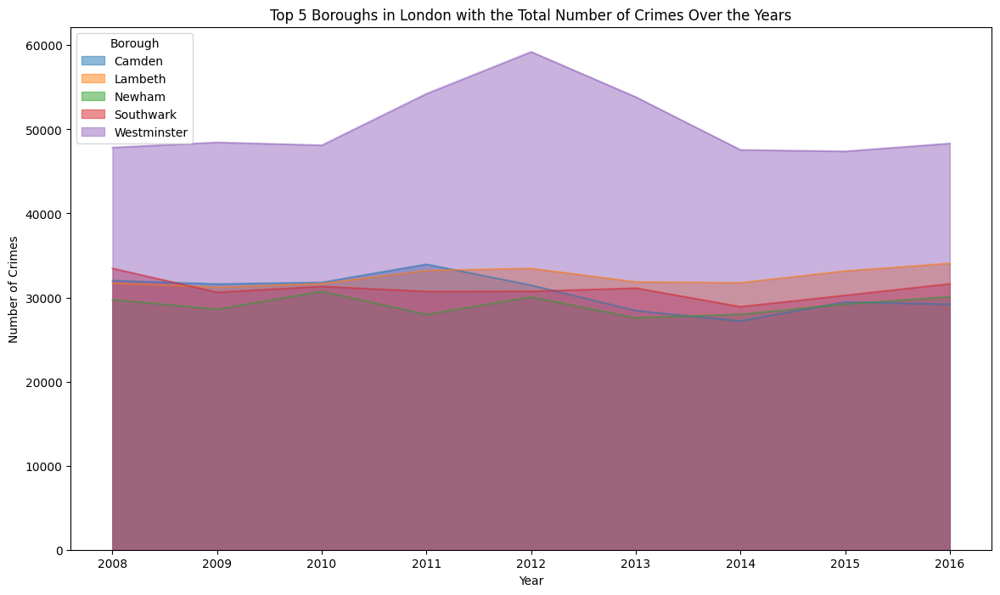

In [18]:
# Create a Pivot Table to transform Boroughs into columns
top5_crimes = top5.pivot(index='year', columns='borough', values='value')

# Make area plot
top5_crimes.plot(kind='area', stacked=False, figsize=(14,8))
plt.title('Top 5 Boroughs in London with the Total Number of Crimes Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.legend(title='Borough', loc='upper left')
plt.show()

**Conclusion:** The area plot depicts the total number of crimes in the top five boroughs with the highest crime rates in London over several years. On the horizontal axis, there are different years, while on the vertical axis, there is the number of crimes. Based on the above graph, `it can be concluded that the 5 boroughs with the highest crime rates are Westminster, Lambeth, Camden, Southwark, and Newham`.

# Scatter Plot
Scatter plot is a type of data visualization that displays individual data points as dots or markers on a two-dimensional plane.

**Is the data normally distributed?**

In [19]:
value_per_month = pd.DataFrame(df.groupby(['date'])['value'].sum().reset_index())
value_per_month

,date,value
0,2008-01-01,65419
1,2008-02-01,62626
2,2008-03-01,61343
3,2008-04-01,59640
4,2008-05-01,62587
...,...,...
103,2016-08-01,62666
104,2016-09-01,61412
105,2016-10-01,63405
106,2016-11-01,61064


<Axes: xlabel='date', ylabel='value'>

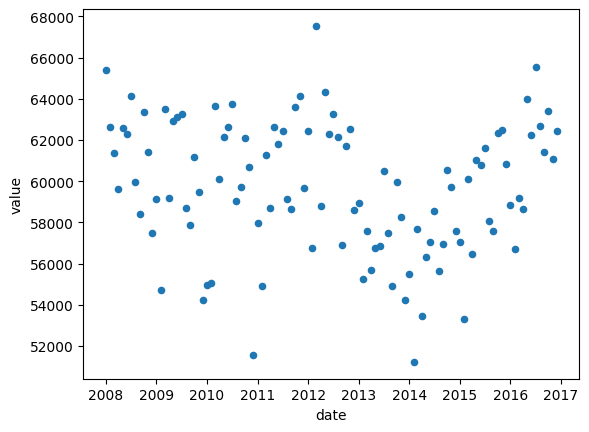

In [20]:
value_per_month.plot.scatter(x='date', y='value')

**Conclusion:** The scatter plot visualizes how the number of crimes changes over time. Each point on the graph represents the total number of recorded crimes for a specific date. By examining the pattern of these points, it can be identified whether there is an increase or decrease in crime over a certain time period. Based on the above graph, it can be seen that the data is randomly distributed and does not form a specific pattern. Therefore, `it can be concluded that the linearity normality test is fulfilled`.

**To support the claim that the data is normally distributed, a test is conducted using a Q-Q plot and a formal hypothesis test.**

## Q-Q plot

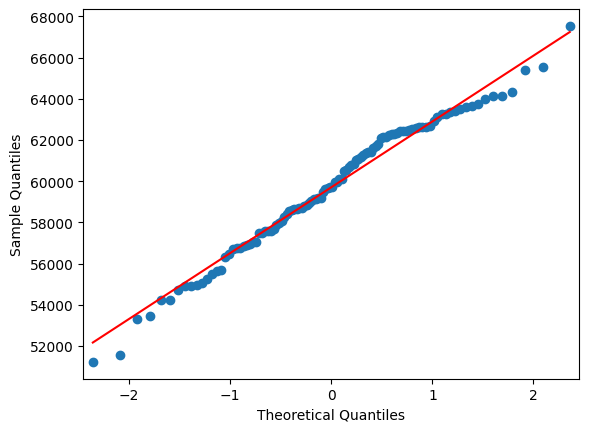

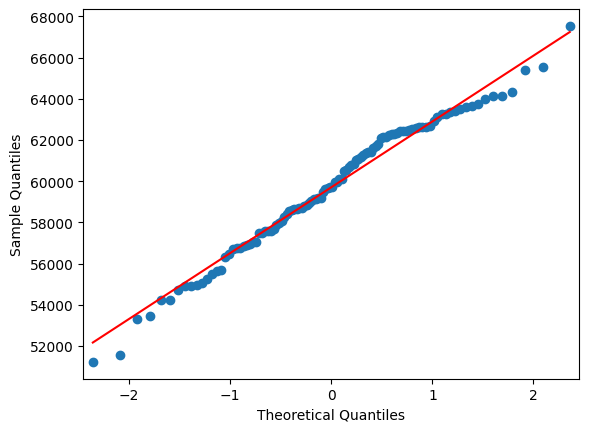

In [21]:
# Create a Q-Q plot for visual normality test
sm.qqplot(value_per_month['value'], line='s') 

**Description:** The Q-Q plot is a plot used to visualize whether the data distribution is close to normal or not. In this case, the Q-Q plot is employed to visually test the normality of the monthly crime count data.

The output of the Q-Q plot displays points that depict how the actual data distributes itself compared to the expected normal distribution. If these points align closely along a straight line at a 45-degree angle, the data tends to be normally distributed. Deviations from this line indicate non-normal distribution.

**Conclusion:** In the Normal Q-Q Plot of Unstandardized Residual, it can be observed that the plots follow a straight line, indicating that the residuals are normally distributed. Therefore, the normality assumption is visually satisfied.

## Uji Hipotesis

In [22]:
# Normality test using Shapiro-Wilk
stat, p_value = stats.shapiro(value_per_month['value'])

# Set the significance level (e.g., alpha = 0.05)
print(p_value)
alpha = 0.05

# Check if the data is normally distributed
if p_value > alpha:
    print("The data is normally distributed (no evidence to reject H0).")
else:
    print("The data is not normally distributed (evidence to reject H0).")

0.1789938062429428
The data is normally distributed (no evidence to reject H0).


- **Hypothesis:**

H0: Normally distributed

H1: Not normally distributed

- **Significance Level:**

α = 5%

- **Test Statistic:**

The test statistic is obtained using the Shapiro-Wilk test, specifically the sig value.

- **Critical Region:**

Reject H0 if sig < α

- **Decision:**

H0 is not rejected as sig (0.1789) > α (0.05).

- **Conclusion:**

At a significance level of α = 5%, H0 is not rejected since sig (0.1789) > α (0.05), indicating that the data is normally distributed.

# Bar Plot
A bar plot, or bar chart, is a data visualization that uses rectangular bars of varying heights to represent data values. 

**How different major crime categories in London have evolved over the years?**

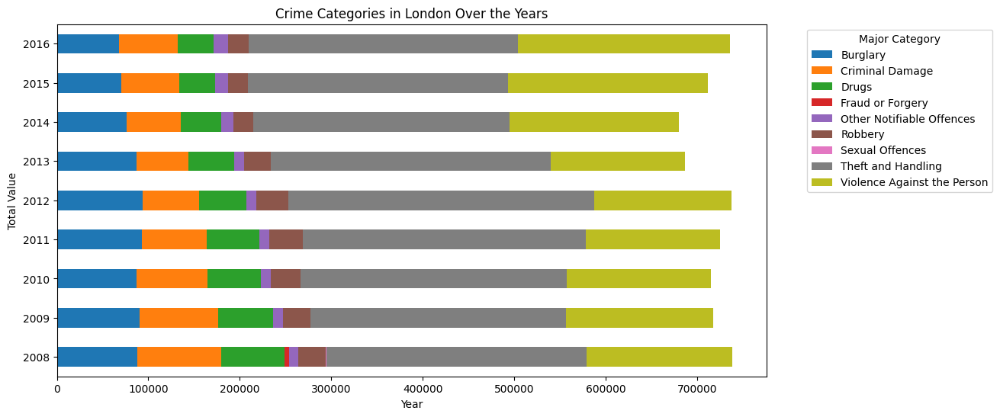

In [23]:
# Group the data by year and major category, and sum the values
grouped = df.groupby(['year', 'major_category'])['value'].sum().unstack()

# Plot a stacked bar chart for each year
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the figure size as needed

grouped.plot(kind='barh', stacked=True, ax=ax)
plt.title('Crime Categories in London Over the Years')
plt.xlabel('Year')
plt.ylabel('Total Value')
plt.legend(title='Major Category', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

**Conclusion:** The stacked bar chart illustrates the comparison of crime counts for each year, divided by major crime categories. It visually displays the distribution of major crime categories for each year. Based on the above chart, `the highest crime count occurred in the year 2012`.

**How does the distribution of major crimes in London differ from year to year?**

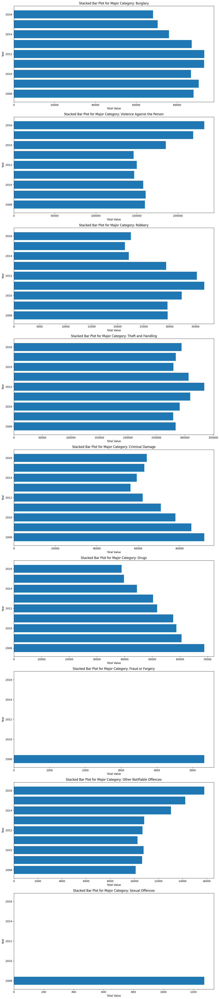

In [24]:
# Get a list of unique major categories
major_categories = df['major_category'].unique()

# Create a separate stacked bar plot for each major category
fig, axs = plt.subplots(nrows=len(major_categories), ncols=1, figsize=(12, 6*len(major_categories)))

for i, category in enumerate(major_categories):
    category_df = df[df['major_category'] == category]
    grouped = category_df.groupby('year')['value'].sum()
    
    # Create the stacked bar plot in the corresponding subplot
    axs[i].barh(grouped.index, grouped, label=category)
    axs[i].set_title(f'Stacked Bar Plot for Major Category: {category}')
    axs[i].set_xlabel('Total Value')
    axs[i].set_ylabel('Year')

plt.tight_layout()
plt.show()

**Conclusion:** Stacked bar plots visualize changes in major categories from year to year. Based on each chart above, `theft and handling consistently stand out as the highest category over the years`.

# Histogram Plot
A histogram plot is a graphical representation of the distribution of a dataset. It divides the data into intervals or bins and shows the frequency or count of data points falling into each bin. 

**What is the annual comparison of Burglary crime rates in the Merton and Bexley?**

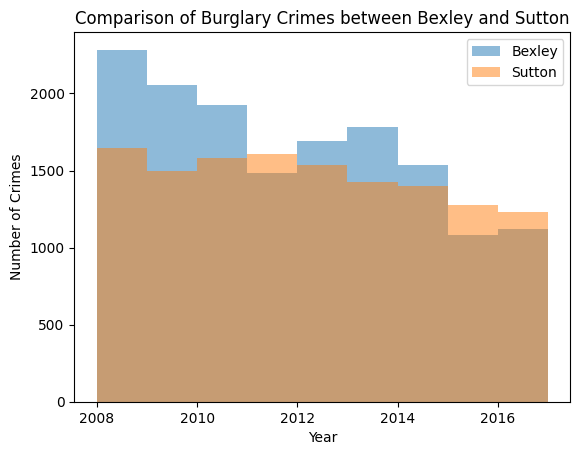

In [25]:
# Define the major category you want to compare (e.g., 'Burglary')
major_category = 'Burglary'

# Filter the data for the specific major category and two boroughs
borough1 = 'Bexley'
borough2 = 'Sutton'
data_borough1 = df[(df['borough'] == borough1) & (df['major_category'] == major_category)]
data_borough2 = df[(df['borough'] == borough2) & (df['major_category'] == major_category)]

# Calculate the number of crimes per year for each borough
crimes_per_year1 = data_borough1.groupby('year')['value'].sum()
crimes_per_year2 = data_borough2.groupby('year')['value'].sum()

# Determine the minimum and maximum years in the data
min_year = min(crimes_per_year1.index.min(), crimes_per_year2.index.min())
max_year = max(crimes_per_year1.index.max(), crimes_per_year2.index.max())

# Create histograms for each borough with bins corresponding to years
bins = range(min_year, max_year + 2)  # Add 2 to include the last year
plt.hist(crimes_per_year1.index, bins=bins, weights=crimes_per_year1, alpha=0.5, label=borough1)
plt.hist(crimes_per_year2.index, bins=bins, weights=crimes_per_year2, alpha=0.5, label=borough2)

plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title(f'Comparison of {major_category} Crimes between {borough1} and {borough2}')
plt.legend()
plt.show()

**Conclusion:** The histogram compares the number of "Burglary" category crimes between two areas, "Bexley" and "Sutton." The histogram shows the distribution of the number of crimes per year for these two areas, with the year on the x-axis and the number of crimes on the y-axis. Based on the graph above, `it can be seen that Bexley has a higher crime rate compared to Sutton except in the years 2011, 2015, and 2016`.

# Box Plot
A box plot, also known as a box-and-whisker plot, is a graphical representation of a dataset's summary statistics. It provides a way to visualize the distribution, central tendency, and spread of a dataset. 

**What is the average range of crimes in London from year to year?**

<Axes: >

<Figure size 2000x1600 with 0 Axes>

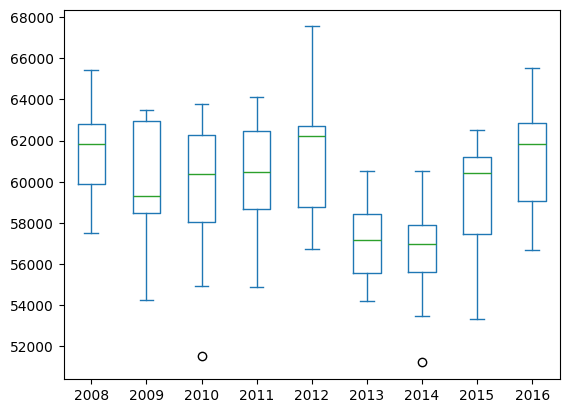

In [26]:
value_per_year = df.groupby(['year','month']).sum(numeric_only=True).unstack().transpose()
plt.figure(figsize=(20, 16))
value_per_year.plot.box()

**Conclusion:** Box plot displays the distribution of crime values per year for each borough in London. Each box in the box plot represents one borough and shows the distribution of annual crime values in that borough. The key elements in the box plot have their respective roles, explained as follows:
- Box: The box in the box plot shows the distribution of data from the first quartile (Q1) to the third quartile (Q3), covering 50% of the data in the middle. The length of this box indicates the interquartile range (IQR), measuring the spread of data in the middle.
- Center Line of the Box (Median): The line in the middle of the box is the median value, which is the middle value in the data distribution.
- Whisker: The whisker is the line connecting the box to the data points outside the whisker.
- Outliers: Outliers are data points outside the whisker, representing data that is far from most other data points.

**Conclusion:** Based on the above box plot, `it can be concluded that the overall average crime rate in London from 2008 to 2016 ranged from 54,000 to 64,000`.

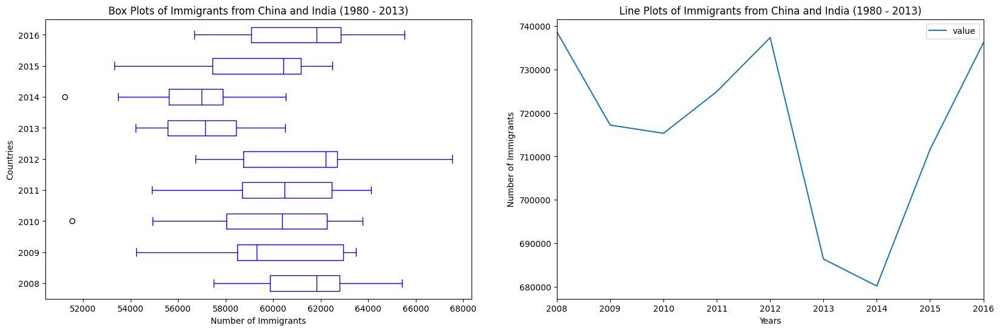

In [27]:
fig = plt.figure() # create figure
ax0 = fig.add_subplot(1, 2, 1) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(1, 2, 2) # add subplot 2 (1 row, 2 columns, second plot) .See tip below**

# Subplot 1: Box plot
value_per_year.plot(kind='box', color='blue', vert=False, figsize=(20, 6), ax=ax0) # add to subplot 1
ax0.set_title('Box Plots of Immigrants from China and India (1980 - 2013)') 
ax0.set_xlabel('Number of Immigrants')
ax0.set_ylabel('Countries')

# Subplot 2: Line plot
sum_peryear.plot(kind='line', figsize=(20, 6), ax=ax1) # add to subplot 2 
ax1.set_title ('Line Plots of Immigrants from China and India (1980 - 2013)')
ax1.set_ylabel('Number of Immigrants')
ax1.set_xlabel('Years')
plt.show()

# Word Clouds
A word cloud is a visual representation of text data where words are displayed in varying sizes and colors. The size of each word in the word cloud is typically proportional to its frequency or importance in the given text. 

**What is the most frequent word in the minor crime category?**

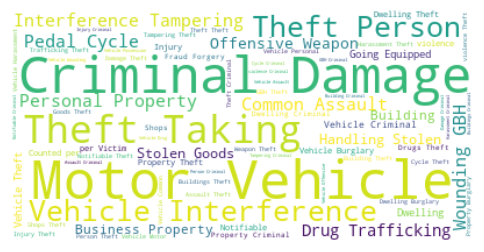

In [28]:
# Create a set of stopwords
stopwords = set(STOPWORDS)

# Replace 0.1 with the fraction of data to use.
sampled_df = df.sample(frac=0.1)

# Generate the WordCloud from the sampled data.
text = " ".join(category for category in sampled_df['minor_category'])

# Create the WordCloud
wordcloud = WordCloud(
    background_color='white',
    stopwords=stopwords,
).generate(text)

# Display the WordCloud
plt.figure(figsize=(6, 6), dpi=100)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**Conclusion:** The WordCloud depicts the most frequently occurring words or phrases in the minor category of the sampled data. Based on the above WordCloud, `the most frequently appearing words are "Motor Vehicle" and "Criminal Damage."`

# Folium Maps and Choropleth Maps
- Folium is a Python library used for creating interactive leaflet maps. It's often used for visualizing geographic data.
- A choropleth map is a type of thematic map in which areas are shaded or patterned in proportion to the value of a variable being represented. These maps are commonly used to visualize and display geographic data, especially when dealing with regional or spatial variations in data. 

**What is the overall crimes situation in London?**

In [29]:
# Range rows in ascending order based on the "borough" column
sort_each_borough = df.sort_values("borough")
sort_each_borough.head()

,borough,major_category,minor_category,value,year,month,date
6308463,Barking and Dagenham,Theft and Handling,Theft/Taking Of Motor Vehicle,0,2014,12,2014-12-01
1844927,Barking and Dagenham,Theft and Handling,Theft From Shops,0,2008,5,2008-05-01
394733,Barking and Dagenham,Violence Against the Person,Offensive Weapon,0,2014,9,2014-09-01
1844942,Barking and Dagenham,Drugs,Possession Of Drugs,0,2008,6,2008-06-01
1844950,Barking and Dagenham,Violence Against the Person,Other violence,0,2014,8,2014-08-01


In [30]:
# Initialize a Nominatim geolocator with a user agent string "MyApp"
geolocator = Nominatim(user_agent="MyApp")

# Store the latitude and longitude coordinates
lat = []
long = []

for i in sort_each_borough["borough"].unique():
    loc = geolocator.geocode(i, timeout=None)
    lat.append(loc.latitude)
    long.append(loc.longitude)

In [31]:
# Organize data into smaller DataFrames, one for each unique borough
split_borough = []
for i in sort_each_borough["borough"].unique():
    split = sort_each_borough[sort_each_borough["borough"] == i]
    split_borough.append(split)

In [32]:
# Add latitude and longitude columns
for i,j,k in zip(split_borough,lat,long):
    i.insert(5,"latitude",j)
    i.insert(6,"longitude",k)

In [37]:
# Sort by their index value
borough_ix = pd.concat(split_borough).sort_index()
borough_ix.head()

,borough,major_category,minor_category,value,year,latitude,longitude,month,date
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,51.371305,-0.101957,11,2016-11-01
1,Greenwich,Violence Against the Person,Other violence,0,2016,51.468626,0.048831,11,2016-11-01
2,Bromley,Violence Against the Person,Other violence,0,2015,51.366857,0.061709,5,2015-05-01
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,51.576320,0.045410,3,2016-03-01
4,Wandsworth,Robbery,Personal Property,0,2008,51.457027,-0.193261,6,2008-06-01


In [38]:
n_sample = 10000
borough_ix_2016 = borough_ix.iloc[2016]
borough_ix_2016 = borough_ix_2016.sample(n=n_sample, random_state=1221, replace=True, axis=0)
borough_ix_2016.head()

latitude                51.65309
value                          0
date         2009-04-01 00:00:00
borough                   Barnet
longitude              -0.200226
Name: 2016, dtype: object

In [39]:
# Use geolocator to search for London
london = geolocator.geocode("London")

print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.5074456
London's longitude	:-0.1277653


Generates a clustered marker map that visualizes crime data in London, specifically focusing on the major categories in each borough for the year 2016.

In [40]:
#Make Follium Maps
londoncrimes_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

londoncrimes = plugins.MarkerCluster().add_to(londoncrimes_map)

for i,j,k in zip(borough_ix_2016["latitude"],borough_ix_2016["longitude"],borough_ix_2016["major_category"]):
    folium.Marker(
        location=[i,j],
        icon=None,
        popup=k
    ).add_to(londoncrimes)

londoncrimes_map

In [41]:
# Open a URL to retrieve its content
with urlopen("https://skgrange.github.io/www/data/london_boroughs.json") as response:
    borough_london = json.load(response)

In [42]:
# Mapping borough names to their IDs for further processing
boroughs_ld = {}
for i in borough_london["features"]:
    i["id"] = i["properties"]["id"]
    boroughs_ld[i["properties"]["name"]] = i["id"]

# Group by "borough" and set column as a regular column
london_crimes = df.groupby("borough").sum(numeric_only=True)[["value"]].reset_index()

# Mapping "borough" names to their corresponding IDs 
london_crimes["id"] = london_crimes["borough"].apply(lambda x: boroughs_ld[x])
london_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


In [43]:
# Make Choropleth Maps
fig = go.Figure()
fig = px.choropleth_mapbox(
    london_crimes,
    geojson=borough_london,
    locations="id",
    mapbox_style="open-street-map",
    center={"lat": 51.5074, "lon": -0.1278},
    hover_name="borough",
    color="value",
    color_continuous_scale="pubu",
    labels={"id":"ID","value":"Number of Crimes"},
    zoom=8.7
)
fig.update_layout(margin={"r":0,"l":0,"b":0},title="Number of Crimes in London",title_x=0.5)
fig.show()

**Conclusion:** Based on the Choropleth Maps above, `it can be concluded that Westminster Borough has the darkest blue color, indicating that the area has the highest number of crime cases`. The areas with medium blue colors have moderate crime rates, and the lighter the shade of blue, the lower the crime rate in those areas.